# Chapter 1 - Read and Present Spatial Data

In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
from geopandas import datasets, GeoDataFrame, read_file

In [2]:
#Data Kabupaten Boyolali
filename = "kabBoyolali4.geojson"
file = open(filename)
kab = gpd.read_file(file)

In [3]:
kab.head()

,KELURAHAN,KECAMATAN,WADMKK,WADMPR,SHAPE_Leng,SHAPE_Area,KODE DAGRI,geometry
0,Kacangan,Andong,Boyolali,Jawa Tengah,0.069242,0.000238,2,"MULTIPOLYGON Z (((110.77184 -7.35850 0.00000, ..."
1,Suroteleng,Selo,Klaten,Jawa Tengah,0.100500,0.000339,17,"MULTIPOLYGON Z (((110.48424 -7.50993 0.00000, ..."
2,Klodran,Colomadu,Sukoharjo,Jawa Tengah,0.062574,0.000120,0,"MULTIPOLYGON Z (((110.79654 -7.53360 0.00000, ..."
3,Siwal,Kaliwungu,Boyolali,Jawa Tengah,0.080605,0.000137,0,"MULTIPOLYGON Z (((110.60216 -7.49017 0.00000, ..."
4,Kradenan,Sambi,Boyolali,Jawa Tengah,0.100069,0.000240,15,"MULTIPOLYGON Z (((110.64399 -7.47035 0.00000, ..."


<AxesSubplot:>

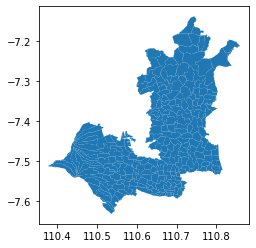

In [4]:
kab.plot()

Text(0.5, 1.0, 'Peta Kab Boyolali')

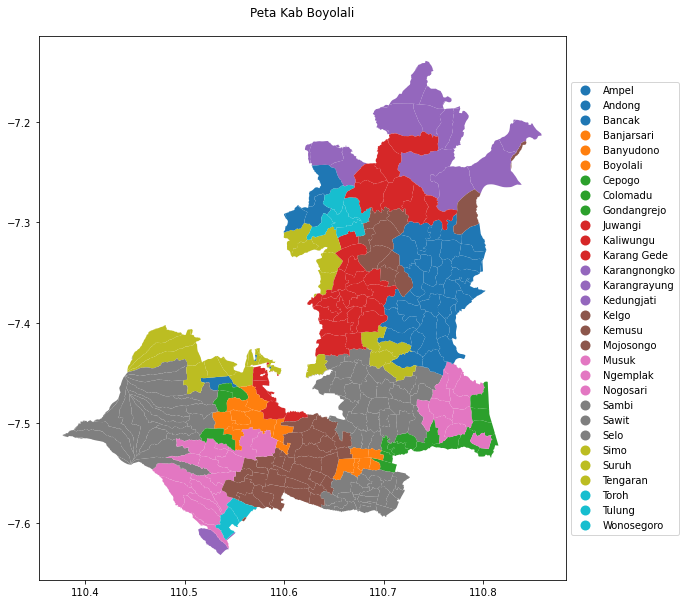

In [5]:
#Styling Kabupaten Boyolali
ax = kab.plot(figsize=(10,10), column='KECAMATAN', categorical=True, legend=True, legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5)})
ax.set_title("Peta Kab Boyolali", pad=20)

In [6]:
#Data Jalan Kabupaten Boyolali
filename = "kabBoyolalijalanraya.geojson"
file = open(filename)
jln = gpd.read_file(file)

In [7]:
jln.head()

,NAMRJL,KONRJL,MATRJL,FGSRJL,UTKRJL,TOLRJL,WLYRJL,AUTRJL,KLSRJL,SPCRJL,...,MEDRJL,LOCRJL,JARRJL,FCODE,REMARK,SRS_ID,LCODE,METADATA,SHAPE_Leng,geometry
0,None,0,0,0,0,0,0,0,0,0,...,0,0,0,None,Jalan Lain,None,CA0080,None,0.007214,MULTILINESTRING Z ((110.51287 -7.48995 905.442...
1,None,0,0,0,0,0,0,0,0,0,...,0,0,0,None,Jalan Lain,None,CA0080,None,0.001917,MULTILINESTRING Z ((110.59675 -7.48561 440.950...
2,None,0,0,0,0,0,0,0,0,0,...,0,0,0,None,Jalan Lain,None,CA0080,None,0.001142,MULTILINESTRING Z ((110.67484 -7.42377 197.553...
3,None,0,0,0,0,0,0,0,0,0,...,0,0,0,None,Jalan Lain,None,CA0080,None,0.004655,MULTILINESTRING Z ((110.51607 -7.45781 868.118...
4,None,0,0,0,0,0,0,0,0,0,...,0,0,0,None,Jalan Lokal,None,CA0080,None,0.005992,MULTILINESTRING Z ((110.69107 -7.36071 253.004...


<AxesSubplot:>

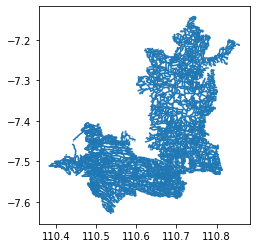

In [8]:
jln.plot()

# Chapter 2 - Overlay

<AxesSubplot:>

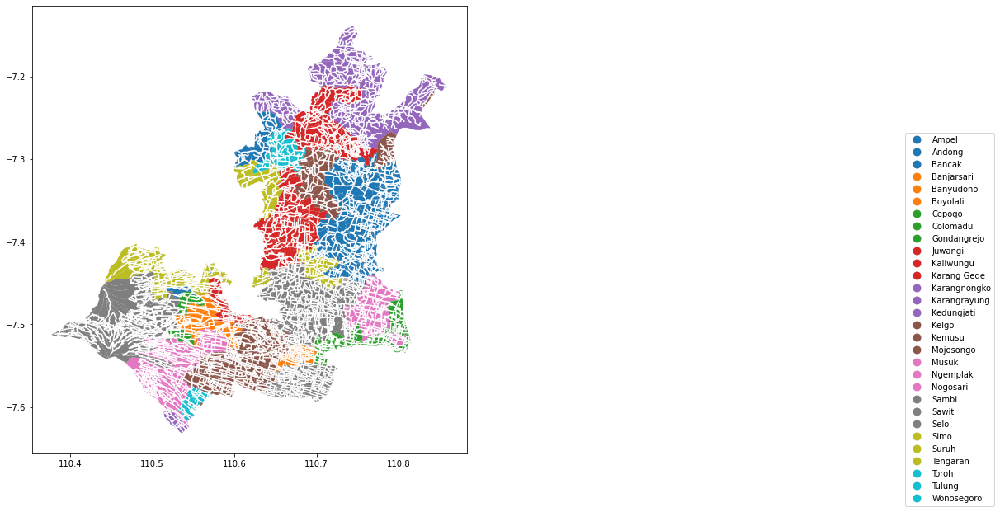

In [9]:
#Kabupaten Boyolali dan Jalan
ax = kab.plot(figsize=(10,10), column='KECAMATAN', categorical=True, legend=True, legend_kwds={'loc': 'center left', 'bbox_to_anchor':(2,0.3)})
jln.plot(ax=ax, zorder=1, color ='w')

In [10]:
kab.explore()

In [11]:
kab.explore(
     column="KECAMATAN", # make choropleth based on "BoroName" column
     tooltip="KECAMATAN", # show "BoroName" value in tooltip (on hover)
     popup=True, # show all values in popup (on click)
     tiles="CartoDB positron", # use "CartoDB positron" tiles
     cmap="Set1", # use "Set1" matplotlib colormap
     style_kwds=dict(color="black") # use black outline
    )

In [12]:
import folium

m = kab.explore(column="KECAMATAN", # make choropleth based on "BoroName" column
     tooltip="KECAMATAN", # show "BoroName" value in tooltip (on hover)
     popup=True, # show all values in popup (on click)
     tiles="CartoDB positron", # use "CartoDB positron" tiles
     cmap="Set1", # use "Set1" matplotlib colormap
     style_kwds=dict(color="black") # use black outline
)

folium.TileLayer('Stamen Toner', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m

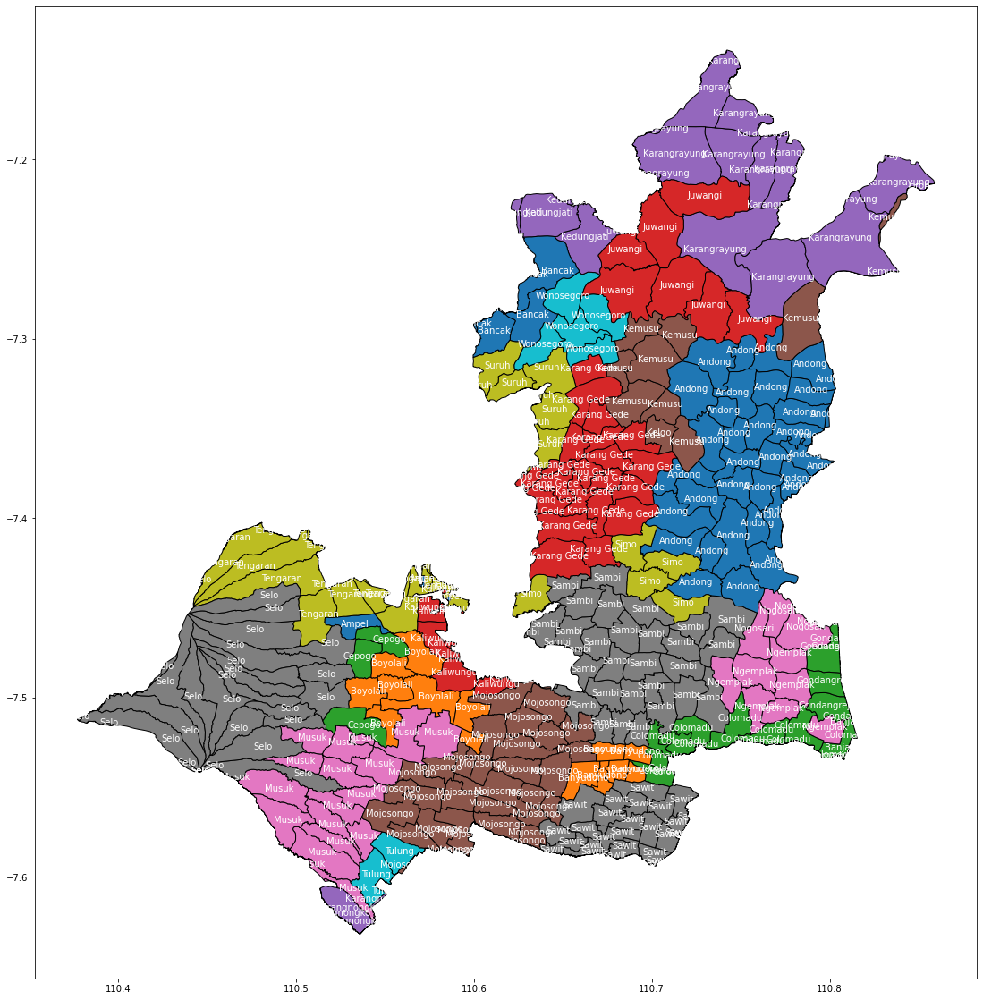

In [13]:
kab['coords'] = kab['geometry'].apply(lambda x: x.representative_point().coords[:])
kab['coords'] = [coords[0] for coords in kab['coords']]

fig, ax = plt.subplots(figsize = (20,20))
kab.plot(ax=ax, column='KECAMATAN', categorical=True, edgecolor='black')

for idx, row in kab.iterrows():
    plt.annotate(text=row['KECAMATAN'], xy=row['coords'], horizontalalignment='center', color='white')

# Chapter 3 CSV vs GeoJSON

In [14]:
#imprt csv data
import pandas as pd

In [15]:
chn = pd.read_csv('datacurahhujan2.csv')

In [16]:
chn

,Kecamatan,KODE DAGRI,Luas,Ketinggian,Januari 2020,Februari 2020,Maret 2020,April 2020,Mei 2020,Juni 2020,Juli 2020,Agustus 2020,September 2020,Oktober 2020,November 2020,Desember 2020
0,Ampel,1,30.38,699,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Andong,2,54.53,154,16.0,6.0,14.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0
2,Banyudono,3,25.38,185,19.0,24.0,18.0,15.0,10.0,3.0,1.0,2.0,1.0,8.0,13.0,19.0
3,Boyolali,4,26.25,461,18.0,22.0,18.0,16.0,10.0,2.0,1.0,3.0,1.0,11.0,11.0,24.0
4,Cepogo,5,53.00,909,24.0,27.0,25.0,18.0,16.0,5.0,1.0,5.0,2.0,12.0,18.0,29.0
5,Gladagsari,6,60.01,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,Juwangi,7,79.99,66,11.0,14.0,13.0,6.0,6.0,0.0,2.0,2.0,3.0,8.0,12.0,19.0
7,Karanggede,8,41.76,295,14.0,16.0,13.0,12.0,10.0,26.0,3.0,33.0,3.0,8.0,12.0,17.0
8,Kemusu,9,81.43,103,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,Klego,10,51.88,261,12.0,13.0,11.0,11.0,4.0,1.0,3.0,1.0,2.0,6.0,10.0,13.0


In [17]:
kab

,KELURAHAN,KECAMATAN,WADMKK,WADMPR,SHAPE_Leng,SHAPE_Area,KODE DAGRI,geometry,coords
0,Kacangan,Andong,Boyolali,Jawa Tengah,0.069242,0.000238,2,"MULTIPOLYGON Z (((110.77184 -7.35850 0.00000, ...","(110.76942146944961, -7.367005499999943)"
1,Suroteleng,Selo,Klaten,Jawa Tengah,0.100500,0.000339,17,"MULTIPOLYGON Z (((110.48424 -7.50993 0.00000, ...","(110.46772136508676, -7.51829350049998)"
2,Klodran,Colomadu,Sukoharjo,Jawa Tengah,0.062574,0.000120,0,"MULTIPOLYGON Z (((110.79654 -7.53360 0.00000, ...","(110.79766018714461, -7.533629545499972)"
3,Siwal,Kaliwungu,Boyolali,Jawa Tengah,0.080605,0.000137,0,"MULTIPOLYGON Z (((110.60216 -7.49017 0.00000, ...","(110.59284543674644, -7.4798429589999635)"
4,Kradenan,Sambi,Boyolali,Jawa Tengah,0.100069,0.000240,15,"MULTIPOLYGON Z (((110.64399 -7.47035 0.00000, ...","(110.64660915329341, -7.470516679499896)"
...,...,...,...,...,...,...,...,...,...
361,Sukorejo,Mojosongo,Klaten,Jawa Tengah,0.111059,0.000427,11,"MULTIPOLYGON Z (((110.57031 -7.56199 0.00000, ...","(110.55295588610826, -7.5660229999999995)"
362,Brojol,Andong,Boyolali,Jawa Tengah,0.096365,0.000387,2,"MULTIPOLYGON Z (((110.79424 -7.35247 0.00000, ...","(110.79014224688991, -7.355030846499972)"
363,Donoyudan,Andong,Boyolali,Jawa Tengah,0.078241,0.000323,2,"MULTIPOLYGON Z (((110.77314 -7.42639 0.00000, ...","(110.77290748257313, -7.424666091362877)"
364,Karanganyar,Tulung,Klaten,Jawa Tengah,0.111794,0.000387,0,"MULTIPOLYGON Z (((110.55535 -7.59913 0.00000, ...","(110.54499051153162, -7.6002105)"


In [18]:
kab2 = kab.merge(chn, on='KODE DAGRI') 
kab2.head()

,KELURAHAN,KECAMATAN,WADMKK,WADMPR,SHAPE_Leng,SHAPE_Area,KODE DAGRI,geometry,coords,Kecamatan,...,Maret 2020,April 2020,Mei 2020,Juni 2020,Juli 2020,Agustus 2020,September 2020,Oktober 2020,November 2020,Desember 2020
0,Kacangan,Andong,Boyolali,Jawa Tengah,0.069242,0.000238,2,"MULTIPOLYGON Z (((110.77184 -7.35850 0.00000, ...","(110.76942146944961, -7.367005499999943)",Andong,...,14.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0
1,Mojo,Andong,Boyolali,Jawa Tengah,0.074736,0.000272,2,"MULTIPOLYGON Z (((110.76019 -7.37294 0.00000, ...","(110.76123576262427, -7.384021000999974)",Andong,...,14.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0
2,Klewer,Andong,Boyolali,Jawa Tengah,0.070700,0.000215,2,"MULTIPOLYGON Z (((110.75898 -7.30595 0.00000, ...","(110.75122040555556, -7.3080655)",Andong,...,14.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0
3,Geneng,Andong,Boyolali,Jawa Tengah,0.074933,0.000286,2,"MULTIPOLYGON Z (((110.77259 -7.39299 0.00000, ...","(110.78260743334215, -7.384256993999972)",Andong,...,14.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0
4,Sarimulyo,Andong,Boyolali,Jawa Tengah,0.109944,0.000299,2,"MULTIPOLYGON Z (((110.77922 -7.31136 0.00000, ...","(110.7669487099082, -7.3064360004999855)",Andong,...,14.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0


In [19]:
kab2

,KELURAHAN,KECAMATAN,WADMKK,WADMPR,SHAPE_Leng,SHAPE_Area,KODE DAGRI,geometry,coords,Kecamatan,...,Maret 2020,April 2020,Mei 2020,Juni 2020,Juli 2020,Agustus 2020,September 2020,Oktober 2020,November 2020,Desember 2020
0,Kacangan,Andong,Boyolali,Jawa Tengah,0.069242,0.000238,2,"MULTIPOLYGON Z (((110.77184 -7.35850 0.00000, ...","(110.76942146944961, -7.367005499999943)",Andong,...,14.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0
1,Mojo,Andong,Boyolali,Jawa Tengah,0.074736,0.000272,2,"MULTIPOLYGON Z (((110.76019 -7.37294 0.00000, ...","(110.76123576262427, -7.384021000999974)",Andong,...,14.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0
2,Klewer,Andong,Boyolali,Jawa Tengah,0.070700,0.000215,2,"MULTIPOLYGON Z (((110.75898 -7.30595 0.00000, ...","(110.75122040555556, -7.3080655)",Andong,...,14.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0
3,Geneng,Andong,Boyolali,Jawa Tengah,0.074933,0.000286,2,"MULTIPOLYGON Z (((110.77259 -7.39299 0.00000, ...","(110.78260743334215, -7.384256993999972)",Andong,...,14.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0
4,Sarimulyo,Andong,Boyolali,Jawa Tengah,0.109944,0.000299,2,"MULTIPOLYGON Z (((110.77922 -7.31136 0.00000, ...","(110.7669487099082, -7.3064360004999855)",Andong,...,14.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260,Kedunglengkong,Simo,Boyolali,Jawa Tengah,0.111200,0.000380,18,"MULTIPOLYGON Z (((110.69633 -7.40259 0.00000, ...","(110.6855082290891, -7.416239)",Simo,...,17.0,16.0,9.0,3.0,4.0,5.0,2.0,13.0,16.0,20.0
261,Rogomulyo,Simo,Boyolali,Jawa Tengah,0.108799,0.000348,18,"MULTIPOLYGON Z (((110.59628 -7.45089 0.00000, ...","(110.58992722148494, -7.443738637466731)",Simo,...,17.0,16.0,9.0,3.0,4.0,5.0,2.0,13.0,16.0,20.0
262,Temon,Simo,Boyolali,Jawa Tengah,0.096453,0.000334,18,"MULTIPOLYGON Z (((110.73326 -7.44315 0.00000, ...","(110.71743871573608, -7.448534)",Simo,...,17.0,16.0,9.0,3.0,4.0,5.0,2.0,13.0,16.0,20.0
263,Pentur,Simo,Boyolali,Jawa Tengah,0.091165,0.000315,18,"MULTIPOLYGON Z (((110.64109 -7.43242 0.00000, ...","(110.63231173258208, -7.443306029999967)",Simo,...,17.0,16.0,9.0,3.0,4.0,5.0,2.0,13.0,16.0,20.0


<AxesSubplot:>

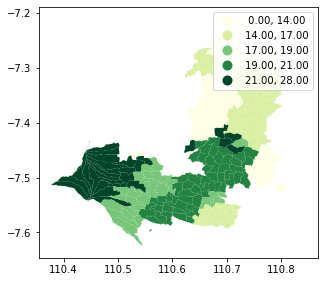

In [20]:
kab2.plot(column='Januari 2020', cmap='YlGn', figsize=(5,5), legend=True, scheme='quantiles')

# Chapter 4 - Model Spasial Sederhana

In [21]:
chn

,Kecamatan,KODE DAGRI,Luas,Ketinggian,Januari 2020,Februari 2020,Maret 2020,April 2020,Mei 2020,Juni 2020,Juli 2020,Agustus 2020,September 2020,Oktober 2020,November 2020,Desember 2020
0,Ampel,1,30.38,699,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Andong,2,54.53,154,16.0,6.0,14.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0
2,Banyudono,3,25.38,185,19.0,24.0,18.0,15.0,10.0,3.0,1.0,2.0,1.0,8.0,13.0,19.0
3,Boyolali,4,26.25,461,18.0,22.0,18.0,16.0,10.0,2.0,1.0,3.0,1.0,11.0,11.0,24.0
4,Cepogo,5,53.00,909,24.0,27.0,25.0,18.0,16.0,5.0,1.0,5.0,2.0,12.0,18.0,29.0
5,Gladagsari,6,60.01,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,Juwangi,7,79.99,66,11.0,14.0,13.0,6.0,6.0,0.0,2.0,2.0,3.0,8.0,12.0,19.0
7,Karanggede,8,41.76,295,14.0,16.0,13.0,12.0,10.0,26.0,3.0,33.0,3.0,8.0,12.0,17.0
8,Kemusu,9,81.43,103,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,Klego,10,51.88,261,12.0,13.0,11.0,11.0,4.0,1.0,3.0,1.0,2.0,6.0,10.0,13.0


In [22]:
#model matemtika sederhana
dc_chn=chn.to_dict() 

In [50]:
klasifikasi = list()
for x in range (0,22): 
    if(dc_chn['Januari 2020'][x] == 0.0):
        klasifikasi.append("Berawan")
    elif(dc_chn['Januari 2020'][x] <= 20.0):
         klasifikasi.append("Hujan Ringan")
    elif(dc_chn['Januari 2020'][x] <= 50.0):
         klasifikasi.append("Hujan Sedang")
    elif(dc_chn['Januari 2020'][x] <= 100.0):
         klasifikasi.append("Hujan Sangat Lebat")
    else:
        klasifikasi.append("Hujan Extreme")

In [24]:
klasifikasi

['Berawan',
 'Hujan Ringan',
 'Hujan Ringan',
 'Hujan Ringan',
 'Hujan Sedang',
 'Berawan',
 'Hujan Ringan',
 'Hujan Ringan',
 'Berawan',
 'Hujan Ringan',
 'Hujan Sedang',
 'Hujan Ringan',
 'Hujan Ringan',
 'Berawan',
 'Hujan Sedang',
 'Hujan Ringan',
 'Hujan Sedang',
 'Hujan Sedang',
 'Hujan Ringan',
 'Hujan Sedang',
 'Berawan',
 'Hujan Ringan']

In [25]:
geo_chn=gpd.GeoDataFrame(dc_chn)

In [26]:
geo_chn['Klasifikasi']=klasifikasi

In [27]:
geo_chn

,Kecamatan,KODE DAGRI,Luas,Ketinggian,Januari 2020,Februari 2020,Maret 2020,April 2020,Mei 2020,Juni 2020,Juli 2020,Agustus 2020,September 2020,Oktober 2020,November 2020,Desember 2020,Klasifikasi
0,Ampel,1,30.38,699,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Berawan
1,Andong,2,54.53,154,16.0,6.0,14.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0,Hujan Ringan
2,Banyudono,3,25.38,185,19.0,24.0,18.0,15.0,10.0,3.0,1.0,2.0,1.0,8.0,13.0,19.0,Hujan Ringan
3,Boyolali,4,26.25,461,18.0,22.0,18.0,16.0,10.0,2.0,1.0,3.0,1.0,11.0,11.0,24.0,Hujan Ringan
4,Cepogo,5,53.00,909,24.0,27.0,25.0,18.0,16.0,5.0,1.0,5.0,2.0,12.0,18.0,29.0,Hujan Sedang
5,Gladagsari,6,60.01,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Berawan
6,Juwangi,7,79.99,66,11.0,14.0,13.0,6.0,6.0,0.0,2.0,2.0,3.0,8.0,12.0,19.0,Hujan Ringan
7,Karanggede,8,41.76,295,14.0,16.0,13.0,12.0,10.0,26.0,3.0,33.0,3.0,8.0,12.0,17.0,Hujan Ringan
8,Kemusu,9,81.43,103,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Berawan
9,Klego,10,51.88,261,12.0,13.0,11.0,11.0,4.0,1.0,3.0,1.0,2.0,6.0,10.0,13.0,Hujan Ringan


In [28]:
kab3=kab.merge(geo_chn, on='KODE DAGRI')

In [29]:
kab3.head()

,KELURAHAN,KECAMATAN,WADMKK,WADMPR,SHAPE_Leng,SHAPE_Area,KODE DAGRI,geometry,coords,Kecamatan,...,April 2020,Mei 2020,Juni 2020,Juli 2020,Agustus 2020,September 2020,Oktober 2020,November 2020,Desember 2020,Klasifikasi
0,Kacangan,Andong,Boyolali,Jawa Tengah,0.069242,0.000238,2,"MULTIPOLYGON Z (((110.77184 -7.35850 0.00000, ...","(110.76942146944961, -7.367005499999943)",Andong,...,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0,Hujan Ringan
1,Mojo,Andong,Boyolali,Jawa Tengah,0.074736,0.000272,2,"MULTIPOLYGON Z (((110.76019 -7.37294 0.00000, ...","(110.76123576262427, -7.384021000999974)",Andong,...,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0,Hujan Ringan
2,Klewer,Andong,Boyolali,Jawa Tengah,0.070700,0.000215,2,"MULTIPOLYGON Z (((110.75898 -7.30595 0.00000, ...","(110.75122040555556, -7.3080655)",Andong,...,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0,Hujan Ringan
3,Geneng,Andong,Boyolali,Jawa Tengah,0.074933,0.000286,2,"MULTIPOLYGON Z (((110.77259 -7.39299 0.00000, ...","(110.78260743334215, -7.384256993999972)",Andong,...,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0,Hujan Ringan
4,Sarimulyo,Andong,Boyolali,Jawa Tengah,0.109944,0.000299,2,"MULTIPOLYGON Z (((110.77922 -7.31136 0.00000, ...","(110.7669487099082, -7.3064360004999855)",Andong,...,2.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,5.0,Hujan Ringan


Text(0.5, 1.0, 'Curah Hujan Januari 2020')

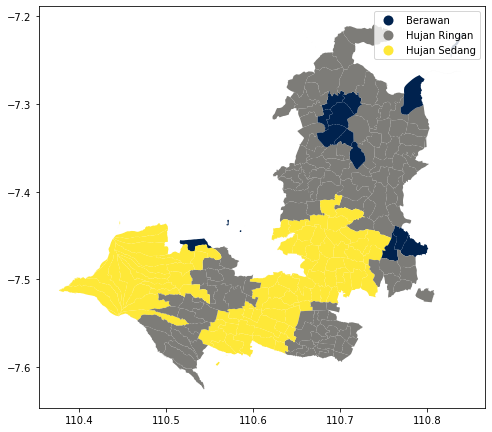

In [30]:
kab3.plot(column='Klasifikasi', cmap='cividis', figsize=(8,8), legend=True) 
ax.set_title("Curah Hujan Januari 2020", pad= 20)

In [31]:
#mencari luas Wilayah Hujan Sedang

#diketahui

cepogo = 53.00
mojosongo = 43.41
sambi = 46.49
selo = 56.08
simo = 48.04
teras = 29.94

In [32]:
S = cepogo + mojosongo + sambi + selo + simo + teras

In [33]:
S

276.96000000000004

In [34]:
#mencari Persentase Wilayah Hujan Sedang

#diketahui

total = 1015.1

In [35]:
persenS = (S/total)*100

In [36]:
persenS

27.284011427445577

In [37]:
#mencari luas Wilayah Hujan Ringan

#diketahui

andong = 54.53
banyudono = 25.38
boyolali = 26.25
juwangi = 79.99
karanggede = 41.76
klego = 51.88
musuk = 30.53
ngemplak = 38.53
sawit = 17.23
tamansari = 34.51
wonosegoro = 51.79

In [38]:
R = andong + banyudono + boyolali + juwangi + karanggede + klego + musuk + ngemplak + sawit + tamansari + wonosegoro

In [39]:
R

452.37999999999994

In [40]:
#mencari Persentase Wilayah Hujan Ringan

#diketahui

total = 1015.1

In [41]:
persenR = (R/total)*100

In [42]:
persenR

44.565067481036344

In [43]:
#mencari luas Wilayah Berawan

#diketahui

ampel = 30.38
gladagsari = 60.01
kemusu = 81.43
nogosari = 55.08
wonosamodro = 58.86

In [44]:
B = ampel + gladagsari + kemusu + nogosari + wonosamodro

In [45]:
B

285.76

In [46]:
#mencari Persentase Wilayah Berawan

#diketahui

total = 1015.1

In [47]:
persenB = (B/total)*100

In [48]:
persenB

28.15092109151808

In [49]:
persenS + persenR + persenB

100.0